# MMAI 894
## Feedforward artificial neural network : Image classification
The goal of this excercise is to show you how to create your first neural network using the tensorflow/keras library. We will be using the MNIST dataset.

References
- https://keras.io/getting-started/sequential-model-guide/
- https://keras.io/api/utils/python_utils/#to_categorical-function
- https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
- https://keras.io/api/layers/core_layers/dense/
- https://keras.io/api/layers/regularization_layers/dropout/
- https://keras.io/api/models/model_training_apis/


### Libraries

In [2]:
# Import modules
# Add modules as needed
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split

# For windows laptops add following 2 lines:
# import matplotlib
# matplotlib.use('agg')

import matplotlib.pyplot as plt

import tensorflow.keras as keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

### Data preparation

#### Import data

In [3]:
def load_data():
    # Import MNIST dataset from openml
    dataset = fetch_openml('mnist_784', version=1, data_home=None)

    # Data preparation
    raw_X = dataset['data']
    raw_Y = dataset['target']
    return raw_X, raw_Y

raw_X, raw_Y = load_data()



In [4]:
raw_X.shape

(70000, 784)

In [5]:
raw_Y.shape

(70000,)

In [13]:
raw_Y.value_counts()

1    7877
7    7293
3    7141
2    6990
9    6958
0    6903
6    6876
8    6825
4    6824
5    6313
Name: class, dtype: int64

In [6]:
raw_Y.dtype

CategoricalDtype(categories=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'], ordered=False)

In [7]:
raw_Y = raw_Y.astype(int)

In [8]:
raw_X.head(2)

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Consider the following
- what shape is X?
- what value ranges does X take? 
 - might this present a problem? 
 - what transformations need to be applied?
- what shape is Y?
- what value ranges does Y take? 
 - what transformations should be applied?

In [9]:
raw_X.max()

pixel1       0.0
pixel2       0.0
pixel3       0.0
pixel4       0.0
pixel5       0.0
            ... 
pixel780    62.0
pixel781     0.0
pixel782     0.0
pixel783     0.0
pixel784     0.0
Length: 784, dtype: float64

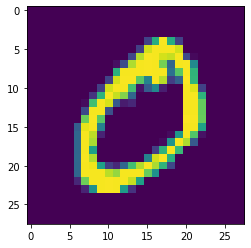

In [10]:
plt.imshow(raw_X.iloc[1].values.reshape(28,28))

In [11]:
raw_X.iloc[1].values.reshape(28,28)

array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,  51., 159., 253., 159.,  50.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0

In [12]:
raw_X.iloc[1].describe()

count    784.000000
mean      39.661990
std       83.940709
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max      255.000000
Name: 1, dtype: float64

In [14]:
import numpy as np

In [15]:
np.array(raw_X[:]).mean(axis = None)

33.385964741253645

In [16]:
np.array(raw_X[:]).std()

78.65437362689433

In [17]:
np.array(raw_X.iloc[1])

array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,  51., 159., 253., 159.,  50.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   

In [18]:
np.array(raw_X.iloc[1])-np.array(raw_X[:]).mean(axis = None)/np.array(raw_X[:]).std()

array([ -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42446419,
        -0.42446419,  -0.42446419,  -0.42446419,  -0.42

In [19]:
def clean_data(raw_X, raw_Y):
    # TODO: clean, QA, and prep raw_X and raw_Y
    # DO NOT CHANGE THE INPUTS OR OUTPUTS TO THIS FUNCTION
    #z = (x - u) / s
    x=raw_X
    u = np.array(raw_X[:]).mean(axis = None)
    s= np.array(raw_X[:]).std()
    z=(x - u) / s
    cleaned_X =z
    cleaned_Y =np.array(raw_Y)
    
    return cleaned_X, cleaned_Y

cleaned_X, cleaned_Y = clean_data(raw_X, raw_Y)

In [255]:
cleaned_X[1].reshape(28,28)

array([[ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        , -0.00409034, -0.00532792, -0.00377967,
        -0.00377967,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        , -0.00377967,
        -0.0057656 , -0.0085645 , -0.0113679 , -0.01464873, -0.01919893,
        -0.02446459, -0.03016352, -0.03195914, -0.03223346, -0.03304008,
        -0.03086828, -0.03026836, -0.02744236, -0.02292856, -0.01853376,
        -0.01611421, -0.01018056, -0.00770729, -0.00405573,  0.        ,
         0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        , -0.00377967, -0.00499511, -0.00789018,
        -0.01073112, -0.01836302, -0.02801078, -0.03764523, -0.05311754,
        -0.06923345, -0.0866

In [213]:
cleaned_X.iloc[1].values.reshape(28,28)

array([[-0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419],
       [-0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419],
       [-0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.4244

In [198]:
cleaned_Y

array(['5', '0', '4', ..., '4', '5', '6'], dtype=object)

In [194]:
cleaned_X.loc[1]

pixel1     -0.424464
pixel2     -0.424464
pixel3     -0.424464
pixel4     -0.424464
pixel5     -0.424464
              ...   
pixel780   -0.424464
pixel781   -0.424464
pixel782   -0.424464
pixel783   -0.424464
pixel784   -0.424464
Name: 1, Length: 784, dtype: float64

In [52]:
cleaned_X.shape

(70000, 784)

In [20]:
cleaned_Y =cleaned_Y.astype(int)

In [21]:
cleaned_Y

array([5, 0, 4, ..., 4, 5, 6])

In [354]:
from sklearn.preprocessing import StandardScaler

In [355]:
sc=StandardScaler()

In [235]:
sc.fit(raw_X)

StandardScaler()

In [356]:
cleaned_X = sc.fit_transform(raw_X)

In [48]:
from sklearn.preprocessing import MinMaxScaler

In [49]:
mm=MinMaxScaler()

In [50]:
mm.fit_transform(raw_X,y=None)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

#### Data split

- Split your data into a train set (50%), validation set (20%) and a test set (30%). You may use scikit-learn's train_test_split function.

In [56]:
50/20

2.5

In [57]:
(70000/50)/(70000/20)

0.4

In [22]:
from sklearn.model_selection import train_test_split

In [23]:
def split_data(cleaned_X, cleaned_Y):
    # TODO: split the data
    # DO NOT CHANGE THE INPUTS OR OUTPUTS TO THIS FUNCTION
    X_train, X_test, Y_train, Y_test = train_test_split(
    cleaned_X, cleaned_Y, test_size=0.30)
    
    X_train, X_val, Y_train, Y_val = train_test_split(
    X_train, Y_train, test_size=0.2855)
    
    
    return X_val, X_test, X_train, Y_val, Y_test, Y_train

X_val, X_test, X_train, Y_val, Y_test, Y_train = split_data(cleaned_X, cleaned_Y)

In [24]:
X_val.reshape(28,28)

AttributeError: 'DataFrame' object has no attribute 'reshape'

In [84]:
X_test.shape

(21000, 784)

In [85]:
X_val.shape

(13721, 784)

In [86]:
X_train.shape

(35279, 784)

In [202]:
round(X_test.shape[0]/70000*100)

30

In [203]:
round(X_train.shape[0]/70000*100)

50

In [204]:
round(X_val.shape[0]/70000*100)

20

In [205]:
70000/30

2333.3333333333335

In [54]:
70000/20

3500.0

In [55]:
70000/50

1400.0

#### [Optional]: plot your data with matplotlib
- Hint: you will need to reshape the row's data into a 28x28 matrix
- https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.imshow.html
- https://docs.scipy.org/doc/numpy/reference/generated/numpy.reshape.html

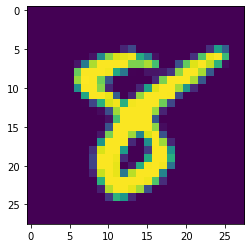

In [399]:
plt.imshow(np.array(X_train[1]).reshape(28,28))

In [125]:
X_train[:10].iloc[1]

pixel1     -0.424464
pixel2     -0.424464
pixel3     -0.424464
pixel4     -0.424464
pixel5     -0.424464
              ...   
pixel780   -0.424464
pixel781   -0.424464
pixel782   -0.424464
pixel783   -0.424464
pixel784   -0.424464
Name: 12238, Length: 784, dtype: float64

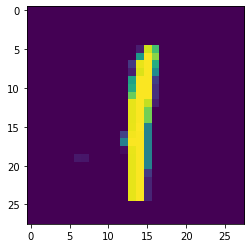

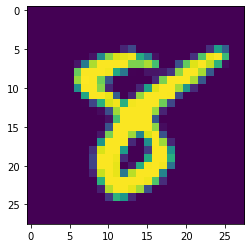

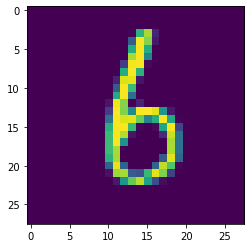

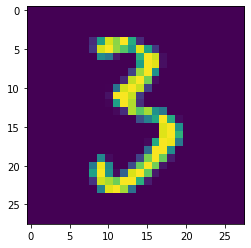

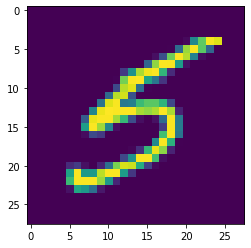

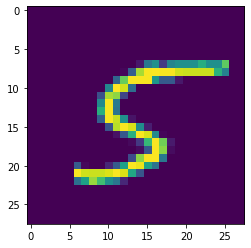

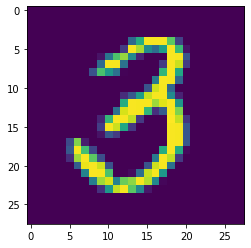

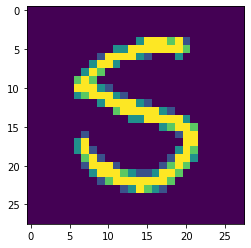

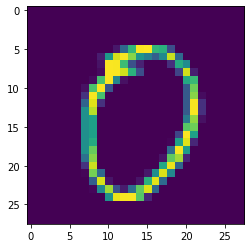

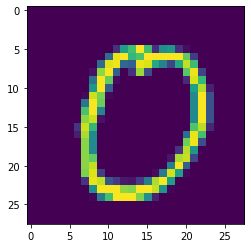

In [25]:
def viz_data(X_train):
    X_train_sample = X_train[:10]
    for i in range(10):
        plt.imshow(np.array(X_train_sample.iloc[i]).reshape(28,28))
        plt.show()
    # TODO: (optional) plot your data with matplotlib
    # DO NOT CHANGE THE INPUTS OR OUTPUTS TO THIS FUNCTION



viz_data(X_train)

### Model

#### Neural network structure
- For this network, we'll use 2 hidden layers
- Layer 1 should have 128 nodes, a dropout rate of 20%, and relu as its activation function
- Layer 2 should have 64 nodes, a dropout rate of 20%, and relu as its activation function
- The last layer should map back to the 10 possible MNIST class. Use softmax as the activation



In [27]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Dense, Dropout, Flatten

In [28]:
def build_model():
    # TODO: build the model, 
    # HINT: you should have Total params: 109,386
    # DO NOT CHANGE THE INPUTS OR OUTPUTS TO THIS FUNCTION
    model = keras.Sequential(name="my_sequential")
    model.add(layers.Flatten(input_shape=(28,28)))
    model.add(layers.Dense(128, activation="relu", name="layer1"))
    model.add(Dropout(0.2))
    model.add(layers.Dense(64, activation="relu", name="layer2"))
    model.add(Dropout(0.2))
    model.add(layers.Dense(10, activation="softmax",name="layer3"))    
    return model

model = build_model()


# Model compilation

- what loss function should you use?
- Note your choice of optimizer
- Include accuracy as a metric (why are we using accuracy here?)

# Model training
- Use a batch size of 128, and train for 12 epochs
- Use verbose training, include validation data


In [29]:
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])

In [36]:
X_train.columns

Index(['pixel1', 'pixel2', 'pixel3', 'pixel4', 'pixel5', 'pixel6', 'pixel7',
       'pixel8', 'pixel9', 'pixel10',
       ...
       'pixel775', 'pixel776', 'pixel777', 'pixel778', 'pixel779', 'pixel780',
       'pixel781', 'pixel782', 'pixel783', 'pixel784'],
      dtype='object', length=784)

In [378]:
X_train[1]

array([-0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
       -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42

In [395]:
np.linspace(-1,1,28).reshape(28,1)

array([[-1.        ],
       [-0.92592593],
       [-0.85185185],
       [-0.77777778],
       [-0.7037037 ],
       [-0.62962963],
       [-0.55555556],
       [-0.48148148],
       [-0.40740741],
       [-0.33333333],
       [-0.25925926],
       [-0.18518519],
       [-0.11111111],
       [-0.03703704],
       [ 0.03703704],
       [ 0.11111111],
       [ 0.18518519],
       [ 0.25925926],
       [ 0.33333333],
       [ 0.40740741],
       [ 0.48148148],
       [ 0.55555556],
       [ 0.62962963],
       [ 0.7037037 ],
       [ 0.77777778],
       [ 0.85185185],
       [ 0.92592593],
       [ 1.        ]])

In [389]:
plt.imshow(X_train[1].reshape(28,28)*[-1,8,-1],cmap='gray')

ValueError: operands could not be broadcast together with shapes (28,28) (3,) 

In [40]:
X_train =X_train.values

In [41]:
X_train.shape

(35010, 784)

In [37]:
X_train = [x.reshape(28,28) for x in X_train]

AttributeError: 'str' object has no attribute 'reshape'

In [345]:
X_train[1].shape

(28, 28)

In [348]:
Y_train.shape

(35010,)

In [281]:
for i in range(X_train.shape[0]):
    print(X_train[i])
    print('^^^^^')
    #X_train[i].reshape(28,28)
    

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.01307352 -0.00724992  0.          0.
  0.          0.         -0.0049701

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.01307352 -0.00724992  0.          0.
  0.          0.         -0.0049701

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

^^^^^
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

  0.          0.          0.          0.        ]
^^^^^
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02  4.88539195e+00  4.08094452e+01  1.43270340e+01
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

  0.          0.          0.          0.        ]
^^^^^
[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.01307352 -0.0072

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.01307352 -0.00724992  0.          0.
  0.          0.         -0.0049701

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.01307352 -0.00724992  0.          0.
  0.          0.         -0.0049701

  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
^^^^^
[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
^^^^^
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  

  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
^^^^^
[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.

  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
^^^^^
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.01307352 -0.00724992  0.          0.
  0.          0.         -0.0049701

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.01307352 -0.00724992  0.          0.
  0.          0.         -0.0049701

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
^^^^^
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

^^^^^
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
^^^^^
[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
^^^^^
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  

  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
^^^^^
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

^^^^^
[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.01307352 -0.00724992  0.          0.
  0.          0.         -0.0

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00409034 -0.00532792 -0.00377967 -0.00377967  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00377967 -0.0057656  -0.0085645  -0.0113679
 -0.01464873 -0.01919893 -0.02446459 -0.03016352 -0.03195914 -0.03223346
 -0.03304008 -0.03086828 -0.03026836 -0.02744236 -0.02292856 -0.01853376
 -0.01611421 -0.01018056 -0.00770729 -0.00405573  0.          0.
  0.          0.          0.          0.         -0.00377967 -0.00499511
 -0.00789018 -0.01073112 -0.01836302 -0.02801078 -0.03764523 -0.05311754
 -0.06923345 -0.0866559  -0.10285079 -0.118111   -0.1306915  -0.13884875
 -0.13836579 -0.13024205 -0.11827745 -0.09989155 -0.07765086 -0.05587092
 -0.03866914 -0.02344834 -0.01307352 -0.00724992  0.          0.
  0.          0.         -0.0049701

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.09033971e-03 -5.32791506e-03 -3.77967173e-03 -3.77967173e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.77967173e-03 -5.76560474e-03 -8.56450342e-03 -1.13679013e-02
 -1.46487258e-02 -1.91989290e-02 -2.44645869e-02 -3.01635248e-02
 -3.19591431e-02 -3.22334599e-02 -3.30400834e-02 -3.08682833e-02
 -3.02683577e-02 -2.74423638e-02 -2.29285604e-02 -1.85337642e-02
 -1.61142119e-02 -1.01805633e-02 -7.70728530e-03 -4.05572859e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.77967173e-03 -4.99510937e-03
 -7.89017972e-03 -1.07311

KeyboardInterrupt: 

In [286]:
X_train[1].shape

(28, 28)

In [302]:
np.array(X_train).shape

(35010, 28, 28)

In [ ]:
np.array(X_train)

In [307]:
np.array(X_train).shape

(35010, 28, 28)

In [309]:
Y_train.reshape(-1,1).shape

(35010, 1)

In [323]:
Y_train.reshape(-1,1,1).shape

(35010, 1, 1)

In [339]:
np.array(X_train).shape

(35010, 28, 28)

In [370]:
X_train.reshape(-1,28,28).shape

(35010, 28, 28)

In [ ]:
X_train.reshape(-1,28,28).shape

In [42]:
model.fit(X_train.reshape(-1,28,28), Y_train,
          batch_size=128,
          epochs=12,
)

Epoch 1/12
274/274 [==============================] - 2s 5ms/step - loss: 0.5246 - accuracy: 0.8346
Epoch 2/12
274/274 [==============================] - 1s 4ms/step - loss: 0.2423 - accuracy: 0.9285
Epoch 3/12
274/274 [==============================] - 1s 4ms/step - loss: 0.1865 - accuracy: 0.9449: 0s - loss: 0.1882 - accuracy: 
Epoch 4/12
274/274 [==============================] - 1s 5ms/step - loss: 0.1486 - accuracy: 0.9538: 0s - loss: 0.151
Epoch 5/12
274/274 [==============================] - 1s 5ms/step - loss: 0.1300 - accuracy: 0.9603
Epoch 6/12
274/274 [==============================] - 1s 5ms/step - loss: 0.1137 - accuracy: 0.9653
Epoch 7/12
274/274 [==============================] - 1s 5ms/step - loss: 0.0985 - accuracy: 0.9690
Epoch 8/12
274/274 [==============================] - 1s 4ms/step - loss: 0.0921 - accuracy: 0.9709
Epoch 9/12
274/274 [==============================] - 1s 5ms/step - loss: 0.0863 - accuracy: 0.9738
Epoch 10/12
274/274 [=============================

In [329]:
def compile_model(model):
    # TODO: compile the model
    # DO NOT CHANGE THE INPUTS OR OUTPUTS TO THIS FUNCTION




    return model

def train_model(model, X_train, Y_train, X_val, Y_val):
    # TODO: train the model
    # DO NOT CHANGE THE INPUTS OR OUTPUTS TO THIS FUNCTION



    history = model.fit(...)
    return model, history


model = compile_model(model)
model, history = train_model(model, X_train, Y_train, X_val, Y_val)

ValueError: Failed to find data adapter that can handle input: <class 'ellipsis'>, <class 'NoneType'>

In [43]:
model.history.history

{'loss': [0.5245633721351624,
  0.24229645729064941,
  0.18647824227809906,
  0.1485528200864792,
  0.130037322640419,
  0.11369238048791885,
  0.09854888916015625,
  0.09209810197353363,
  0.08629269897937775,
  0.07611258327960968,
  0.0761372447013855,
  0.06836709380149841],
 'accuracy': [0.8345615267753601,
  0.9285346865653992,
  0.9449300169944763,
  0.9538131952285767,
  0.9602970480918884,
  0.9652670621871948,
  0.9689803123474121,
  0.9708940386772156,
  0.9738360643386841,
  0.9759211540222168,
  0.9753784537315369,
  0.9774921536445618]}

# Model evaluation
- Show the performance on the test set
- What is the difference between "evaluate" and "predict"?
- Identify a few images the model classifies incorrectly. Any observations?

In [402]:
model.summary()

Model: "my_sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
layer1 (Dense)               (None, 128)               100480    
_________________________________________________________________
module_wrapper (ModuleWrappe (None, 128)               0         
_________________________________________________________________
layer2 (Dense)               (None, 64)                8256      
_________________________________________________________________
module_wrapper_1 (ModuleWrap (None, 64)                0         
_________________________________________________________________
layer3 (Dense)               (None, 10)                650       
Total params: 109,386
Trainable params: 109,386
Non-trainable params: 0
_______________________________________________

In [ ]:
def build_model():
    # TODO: build the model, 
    # HINT: you should have Total params: 109,386
    # DO NOT CHANGE THE INPUTS OR OUTPUTS TO THIS FUNCTION
    model = keras.Sequential(name="my_sequential")
    model.add(layers.Flatten(input_shape=(28,28)))
    model.add(layers.Dense(128, activation="relu", name="layer1"))
    model.add(Dropout(0.2))
    model.add(layers.Dense(64, activation="relu", name="layer2"))
    model.add(Dropout(0.2))
    model.add(layers.Dense(10, activation="softmax",name="layer3"))    
    return model

model = build_model()


In [44]:
model.evaluate(X_test,Y_test)

657/657 [==============================] - 2s 2ms/step - loss: 0.1024 - accuracy: 0.9705


[0.10243813693523407, 0.9705238342285156]

In [47]:
p=model.predict(X_test.values.reshape(-1,28,28))

In [48]:
p.shape[0]

21000

In [49]:
np.argmax(p[1])

2

In [50]:
l=[]

In [51]:
for i in range(p.shape[0]):
    t=np.argmax(p[i])
    l.append(t)

In [52]:
np.array(l)

array([3, 2, 9, ..., 9, 7, 5])

In [53]:
p[0]

array([4.2015063e-09, 6.3652908e-07, 2.3783107e-07, 9.9831343e-01,
       5.8073808e-09, 2.2469550e-04, 4.9487792e-10, 8.9849827e-06,
       4.9469087e-05, 1.4026330e-03], dtype=float32)

In [54]:
from sklearn.metrics import accuracy_score

In [55]:
Y_test.shape

(21000,)

In [56]:
p[3]

array([2.7435293e-10, 9.9998808e-01, 3.6119288e-06, 5.7386865e-07,
       7.0835819e-07, 4.2111825e-08, 1.8933004e-09, 4.7510521e-06,
       2.2288511e-06, 3.2586631e-09], dtype=float32)

In [57]:
accuracy_score(Y_test,np.array(l))

0.9705238095238096

In [ ]:
def eval_model(model, X_test, Y_test):
    # TODO: evaluate the model
    # DO NOT CHANGE THE INPUTS OR OUTPUTS TO THIS FUNCTION





    return test_loss, test_accuracy

test_loss, test_accuracy = eval_model(model, X_test, Y_test)

In [58]:
dir(model)

['_TF_MODULE_IGNORED_PROPERTIES',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_activity_regularizer',
 '_add_trackable',
 '_add_variable_with_custom_getter',
 '_assert_compile_was_called',
 '_assert_weights_created',
 '_auto_track_sub_layers',
 '_autocast',
 '_autographed_call',
 '_base_model_initialized',
 '_build_graph_network_for_inferred_shape',
 '_build_input_shape',
 '_call_accepts_kwargs',
 '_call_arg_was_passed',
 '_call_fn_arg_defaults',
 '_call_fn_arg_positions',
 '_call_fn_args',
 '_call_full_argspec',
 '_callable_losses',
 '_cast_single_input',
 '_check_call_args',
 '_checkpoint_dependencies',
 '_clear_los

In [62]:
model.summary()

Model: "my_sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
layer1 (Dense)               (None, 128)               100480    
_________________________________________________________________
module_wrapper (ModuleWrappe (None, 128)               0         
_________________________________________________________________
layer2 (Dense)               (None, 64)                8256      
_________________________________________________________________
module_wrapper_1 (ModuleWrap (None, 64)                0         
_________________________________________________________________
layer3 (Dense)               (None, 10)                650       
Total params: 109,386
Trainable params: 109,386
Non-trainable params: 0
_______________________________________________

In [ ]:
model = keras.Sequential(name="my_sequential")
    model.add(layers.Flatten(input_shape=(28,28)))
    model.add(layers.Dense(128, activation="relu", name="layer1"))
    model.add(Dropout(0.2))
    model.add(layers.Dense(64, activation="relu", name="layer2"))
    model.add(Dropout(0.2))
    model.add(layers.Dense(10, activation="softmax",name="layer3"))    
    return model

In [539]:
model2 = keras.Sequential()
model2.add(layers.Flatten(input_shape=(28,28)))
model2.add(layers.Dense(1, activation='relu'))
model2.add(Dense(1,activation='sigmoid'))

In [563]:
model2.compile(loss=keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])

In [547]:
X_train[1].reshape(-1,28,28).shape

(1, 28, 28)

In [558]:
test1=Y_train[1].astype(float)

In [548]:
np.array(Y_train[1]).reshape(-1,1,1)

array([[[8]]])

In [561]:
np.array(test1).reshape(-1,1,1)

array([[[8.]]])

In [564]:
model2.fit(X_train[1].reshape(-1,28,28), np.array(test1).reshape(-1,1,1),\
          epochs=1 )

/Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/backend.py:5016: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  warnings.warn(


1/1 [==============================] - 1s 1s/step - loss: 0.6931 - accuracy: 0.0000e+00


In [510]:
model2.fit(X_train[1:5].reshape(-1,28,28), Y_train[1:5],\
          batch_size=128,\
          epochs=1 )

1/1 [==============================] - 0s 6ms/step - loss: 1.8305 - accuracy: 0.5000


In [483]:
model.fit(X_train.reshape(-1,28,28),Y_train)

ValueError: in user code:

    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:855 train_function  *
        return step_function(self, iterator)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:845 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/distribute/distribute_lib.py:1285 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/distribute/distribute_lib.py:2833 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/distribute/distribute_lib.py:3608 _call_for_each_replica
        return fn(*args, **kwargs)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:838 run_step  **
        outputs = model.train_step(data)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:796 train_step
        loss = self.compiled_loss(
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/engine/compile_utils.py:204 __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/losses.py:155 __call__
        losses = call_fn(y_true, y_pred)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/losses.py:259 call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/util/dispatch.py:206 wrapper
        return target(*args, **kwargs)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/losses.py:1754 binary_crossentropy
        backend.binary_crossentropy(
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/util/dispatch.py:206 wrapper
        return target(*args, **kwargs)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/keras/backend.py:5023 binary_crossentropy
        return nn.sigmoid_cross_entropy_with_logits(labels=target, logits=output)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/util/dispatch.py:206 wrapper
        return target(*args, **kwargs)
    /Users/user/.local/lib/python3.8/site-packages/tensorflow/python/ops/nn_impl.py:132 sigmoid_cross_entropy_with_logits
        raise ValueError("logits and labels must have the same shape (%s vs %s)" %

    ValueError: logits and labels must have the same shape ((None, 10) vs (None, 1))


In [78]:
model.layers[1].get_weights()[0]

array([[-2.65434012e-02, -2.62371767e-02, -4.56232391e-02, ...,
        -2.78097633e-02,  6.75069764e-02, -1.03510115e-02],
       [-4.80833948e-02, -4.95742424e-05,  3.65126170e-02, ...,
        -4.08969223e-02, -3.18699405e-02, -6.22464418e-02],
       [ 8.48297030e-03,  1.42026125e-02, -6.56112358e-02, ...,
         3.43531184e-03, -6.66832402e-02, -8.35703406e-03],
       ...,
       [-5.99219874e-02, -2.76959371e-02,  9.59454291e-03, ...,
        -1.62355173e-02, -6.25504330e-02, -4.07021120e-02],
       [ 7.32091144e-02,  1.00695193e-01, -1.73370470e-03, ...,
         5.41432276e-02, -6.72372580e-02, -4.53548953e-02],
       [-5.19506335e-02,  6.59930259e-02, -4.36154939e-02, ...,
         2.11034250e-02,  7.25858361e-02, -1.86155550e-02]], dtype=float32)

In [419]:
for i in range(len(model.layers)):
    model.layers[1].get_weights()[i]
    print(i)
    

0
1


IndexError: list index out of range

In [428]:
model.layers[5].get_weights()[1]

array([-0.05383216, -0.13301016, -0.03990718,  0.00952342, -0.07316783,
       -0.09826127, -0.02335279, -0.05567363,  0.25634038,  0.14497179],
      dtype=float32)

In [85]:
model.layers[1].get_weights()[0][1]

array([-4.80833948e-02, -4.95742424e-05,  3.65126170e-02,  1.70635544e-02,
       -6.55013770e-02,  3.11647188e-02,  1.41347200e-02, -2.79104039e-02,
       -5.56979747e-03,  4.75484245e-02,  6.35044575e-02,  2.23622713e-02,
       -2.01284308e-02,  4.70032319e-02, -8.03547576e-02, -7.52765611e-02,
        1.47800241e-02,  2.29381472e-02,  3.91451679e-02,  7.98196495e-02,
        3.88631970e-02,  8.55379924e-02,  1.09462971e-02, -3.54028144e-03,
        7.25125894e-02, -7.10926205e-02, -2.95268744e-02,  5.52292839e-02,
       -2.93959654e-03,  4.37697172e-02, -2.12696567e-02,  1.19730765e-02,
        6.17328361e-02,  2.33201273e-02,  4.78044003e-02,  5.28229438e-02,
       -1.29457400e-03, -1.91419795e-02, -1.03538753e-02, -4.20220606e-02,
        3.67343538e-02, -2.82090642e-02,  1.35748647e-02,  2.98474301e-02,
        9.71646514e-03,  5.52743748e-02,  3.16493423e-03,  6.48180842e-02,
       -3.96519862e-02, -5.45333400e-02,  9.46547985e-02,  8.71161297e-02,
       -5.00879856e-03, -

In [95]:
for layer in model.layers:
    print('iii')
    #weights = layer.get_weights() 

iii
iii
iii
iii
iii
iii


In [122]:
model.layers[1].get_weights()[0].shape

(784, 128)

In [128]:
model.layers[1].get_weights()[0].T.shape

(128, 784)

In [130]:
model.layers[1].get_weights()[0].T.reshape(-1,28,28)

array([[[-2.65434012e-02, -4.80833948e-02,  8.48297030e-03, ...,
         -2.05938667e-02, -3.94263193e-02,  5.20031452e-02],
        [ 5.03468048e-03,  1.45613020e-02, -4.83286828e-02, ...,
         -1.42549910e-02,  2.52797711e-03, -5.38064688e-02],
        [ 8.31213370e-02, -2.86312923e-02,  8.79973397e-02, ...,
         -4.43851091e-02,  1.80210769e-02, -4.56947908e-02],
        ...,
        [-6.22189008e-02,  4.44471762e-02,  3.50892618e-02, ...,
         -5.45483781e-03,  8.10155496e-02,  4.87832725e-03],
        [ 7.88967982e-02, -2.24934313e-02,  1.70006752e-02, ...,
         -2.32524928e-02, -1.74982268e-02,  8.82819369e-02],
        [ 5.24922460e-02,  5.38116470e-02,  4.85586748e-02, ...,
         -5.99219874e-02,  7.32091144e-02, -5.19506335e-02]],

       [[-2.62371767e-02, -4.95742424e-05,  1.42026125e-02, ...,
          1.33525478e-02, -5.84438108e-02,  7.96889514e-02],
        [ 6.33344948e-02, -2.63262484e-02,  4.27426537e-03, ...,
         -3.37642878e-02,  1.65989306e

In [204]:
model.summary()

Model: "my_sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
layer1 (Dense)               (None, 128)               100480    
_________________________________________________________________
module_wrapper (ModuleWrappe (None, 128)               0         
_________________________________________________________________
layer2 (Dense)               (None, 64)                8256      
_________________________________________________________________
module_wrapper_1 (ModuleWrap (None, 64)                0         
_________________________________________________________________
layer3 (Dense)               (None, 10)                650       
Total params: 109,386
Trainable params: 109,386
Non-trainable params: 0
_______________________________________________

In [403]:
model.layers

In [207]:
model.layers[2]

In [165]:
model.layers[1].get_weights()[0].T.shape

(128, 784)

In [166]:
X_train[0].shape

(784,)

In [190]:
model.layers[1].get_weights()[1].shape

(128,)

In [203]:
model.layers[1].get_weights()[0][4].shape

(128,)

In [416]:
model.layers[3].get_weights()[0].shape

(128, 64)

In [228]:
(model.layers[1].get_weights()[0].T*X_train[0])

(128, 784)

In [579]:
dir(model.layers[1])

['_TF_MODULE_IGNORED_PROPERTIES',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_activity_regularizer',
 '_add_trackable',
 '_add_variable_with_custom_getter',
 '_auto_track_sub_layers',
 '_autocast',
 '_autographed_call',
 '_build_input_shape',
 '_call_accepts_kwargs',
 '_call_arg_was_passed',
 '_call_fn_arg_defaults',
 '_call_fn_arg_positions',
 '_call_fn_args',
 '_call_full_argspec',
 '_callable_losses',
 '_cast_single_input',
 '_checkpoint_dependencies',
 '_clear_losses',
 '_compute_dtype',
 '_compute_dtype_object',
 '_dedup_weights',
 '_default_training_arg',
 '_deferred_dependencies',
 '_delete_tracking',
 '_dtype

In [229]:
plt.imshow((model.layers[3].get_weights()[0]*(model.layers[1].get_weights()[0].T*X_train[0])),aspect=2)

ValueError: operands could not be broadcast together with shapes (128,64) (128,784) 

In [431]:
X_train[0].shape

(784,)

In [430]:
model.layers[1].get_weights()[1].shape

(128,)

In [429]:
model.layers[1].get_weights()[0].shape

(784, 128)

In [434]:
model.layers[1].get_weights()[0]*X_train[0].reshape(-1,1)+model.layers[1].get_weights()[1]

array([[ 0.00220568, -0.01052102,  0.00712777, ...,  0.01289756,
        -0.04240366,  0.00487688],
       [ 0.01134863, -0.02163672, -0.02773596, ...,  0.01845259,
        -0.00022171,  0.02690463],
       [-0.01266176, -0.02768626,  0.01561196, ..., -0.00036486,
         0.01455529,  0.00403051],
       ...,
       [ 0.01637369, -0.00990183, -0.0163102 , ...,  0.0079847 ,
         0.01280106,  0.01775983],
       [-0.04013569, -0.06439926, -0.01150177, ..., -0.02188855,
         0.01479045,  0.01973477],
       [ 0.01299014, -0.04966944,  0.00627555, ..., -0.00786434,
        -0.04455945,  0.00838488]])

In [565]:
model2.layers[1].get_weights()[0].shape

(784, 1)

In [566]:
X_train[0].reshape(-1,1).shape

(784, 1)

In [567]:
m2o1= model2.layers[1].get_weights()[0]*X_train[0].reshape(-1,1)+model2.layers[1].get_weights()[1]

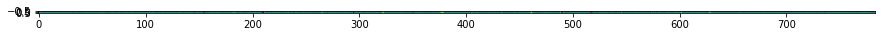

In [576]:
plt.figure(figsize=(15,20))
plt.imshow(m2o1.T,aspect=2)

In [571]:
model2.layers[2].get_weights()[0].shape

(1, 1)

In [572]:
model2.layers[2].get_weights()[1].shape

(1,)

In [573]:
m2o2= model2.layers[2].get_weights()[0]+model2.layers[2].get_weights()[1]

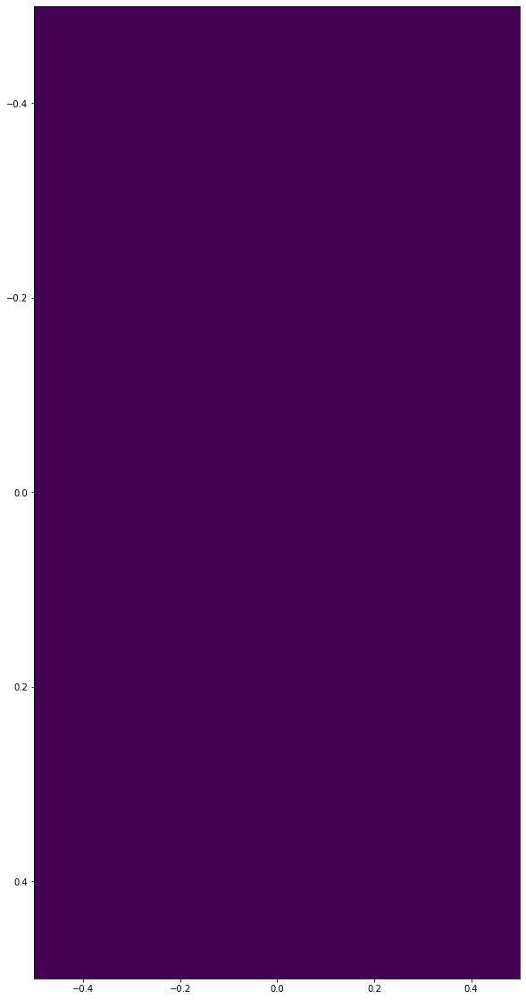

In [574]:
plt.figure(figsize=(15,20))
plt.imshow(m2o2,aspect=2)

In [580]:
model.summary()

Model: "my_sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
layer1 (Dense)               (None, 128)               100480    
_________________________________________________________________
module_wrapper (ModuleWrappe (None, 128)               0         
_________________________________________________________________
layer2 (Dense)               (None, 64)                8256      
_________________________________________________________________
module_wrapper_1 (ModuleWrap (None, 64)                0         
_________________________________________________________________
layer3 (Dense)               (None, 10)                650       
Total params: 109,386
Trainable params: 109,386
Non-trainable params: 0
_______________________________________________

In [584]:
model.layers[2].output

<KerasTensor: shape=(None, 128) dtype=float32 (created by layer 'module_wrapper')>

In [592]:
model.get_layer('flatten').output

<KerasTensor: shape=(None, 784) dtype=float32 (created by layer 'flatten')>

In [593]:
from tensorflow.keras import backend as K

In [641]:
# create a Keras function to get i-th layer
get_layer_output = K.function(inputs = model.layers[0].input, outputs = model.layers[5].output)

layer_output = get_layer_output(X_train.reshape(-1,28,28))

In [642]:
layer_output.shape

(35010, 10)

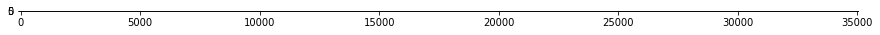

In [643]:
plt.figure(figsize=(15,20))
plt.imshow(layer_output.T,aspect=1)


In [435]:
o1=model.layers[1].get_weights()[0]*X_train[0].reshape(-1,1)+model.layers[1].get_weights()[1]

In [439]:
o1.shape

(784, 128)

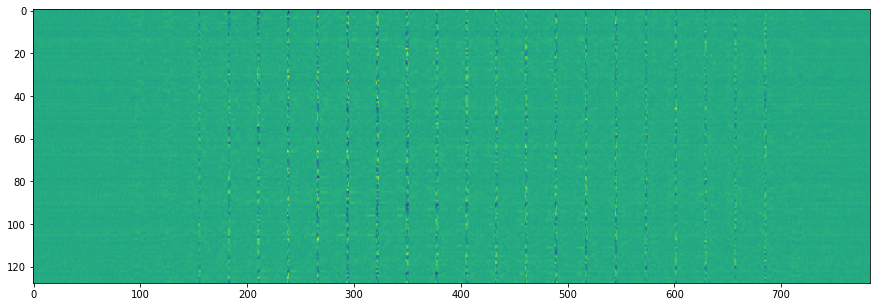

In [440]:
plt.figure(figsize=(15,20))
plt.imshow(o1.T,aspect=2)

In [451]:
o1.T.shape

(128, 784)

In [445]:
model.layers[3].get_weights()[1].shape

(64,)

In [450]:
model.layers[3].get_weights()[0].T.shape

(64, 128)

In [454]:
o2=model.layers[3].get_weights()[0]+model.layers[3].get_weights()[1]

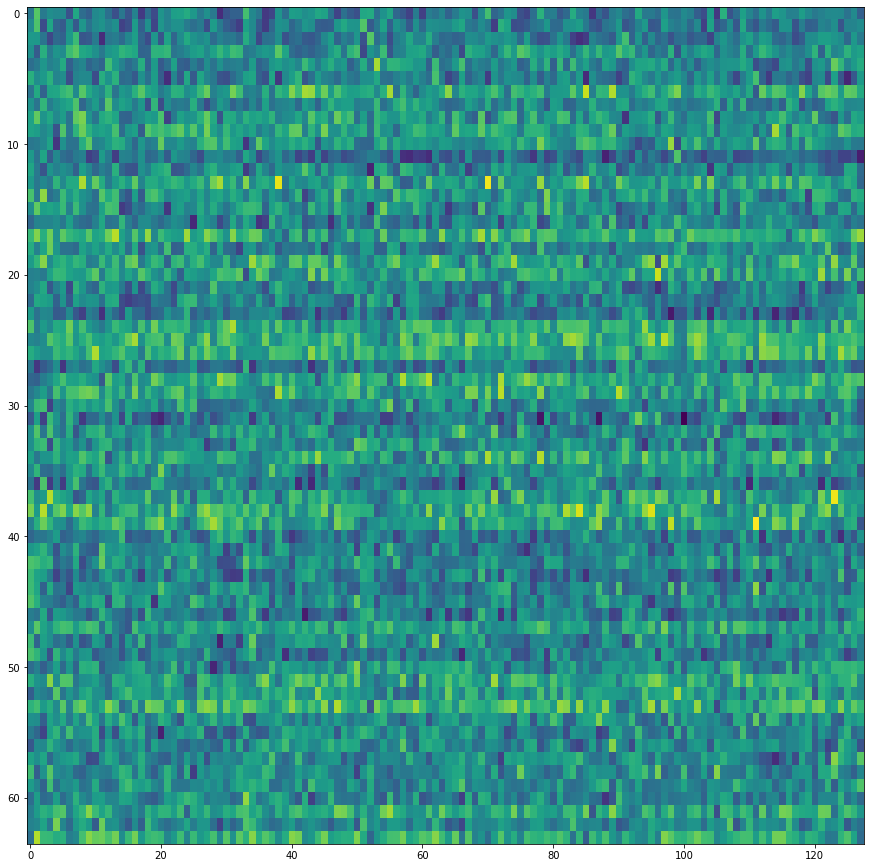

In [455]:
plt.figure(figsize=(15,20))
plt.imshow(o2.T,aspect=2)

In [460]:
o2.shape

(128, 64)

In [458]:
model.layers[5].get_weights()[0].shape

(64, 10)

In [459]:
model.layers[5].get_weights()[1].shape

(10,)

In [462]:
o3=model.layers[5].get_weights()[0]+model.layers[5].get_weights()[1]

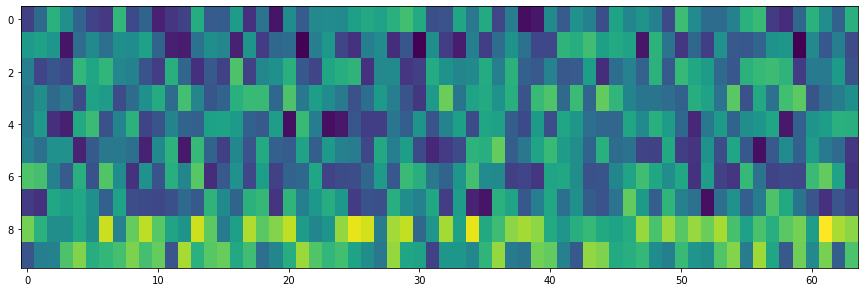

In [463]:
plt.figure(figsize=(15,20))
plt.imshow(o3.T,aspect=2)

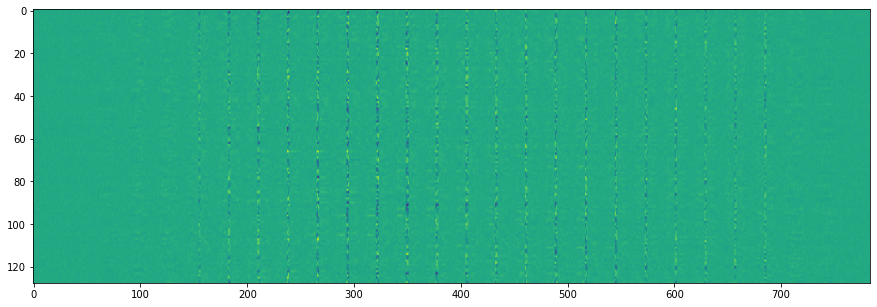

In [247]:
plt.figure(figsize=(15,20))
plt.imshow((model.layers[1].get_weights()[0].T*X_train[0]),aspect=2)
#plt.imshow(model.layers[1].get_weights()[1])

In [153]:
model.layers[2].output[1]

<KerasTensor: shape=(128,) dtype=float32 (created by layer 'tf.__operators__.getitem_1')>

In [164]:
for layer in model.layers:
    print(layer)
    #x = layers(x)

In [252]:
X_train.shape

(35010, 784)

In [261]:
model.layers[1].get_weights()[0].reshape(-1,1).T

array([[-0.0265434 , -0.02623718, -0.04562324, ...,  0.02110342,
         0.07258584, -0.01861556]], dtype=float32)

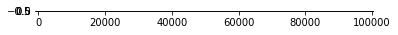

In [253]:
plt.imshow(model.layers[1].get_weights()[0].reshape(-1,1).T,aspect=10)

In [268]:
X_train[1].shape

(784,)

In [298]:
X_train[0].flatten().shape

(784,)

In [303]:
model.layers[1].get_weights()[0][1].shape

(128,)

In [301]:
X_train[0].flatten().reshape(28,28)

array([[-0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419],
       [-0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419],
       [-0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.42446419, -0.42446419, -0.42446419, -0.42446419,
        -0.42446419, -0.4244

In [311]:
len(model.layers[1].get_weights()[0])

784

In [310]:
model.layers[1].get_weights()[0][5].shape

(128,)

In [312]:
model.layers[1].get_weights()[0].shape

(784, 128)

In [314]:
model.layers[1].get_weights()[0].T.shape

(128, 784)

In [361]:
(model.layers[1].get_weights()[0].T*X_train[0]).shape

(128, 784)

In [368]:
(model.layers[1].get_weights()[0].T*X_train[0])+(model.layers[1].get_weights()[1].flatten().reshape(-1,1))[0]

array([[ 0.00220568,  0.01134863, -0.01266176, ...,  0.01637369,
        -0.04013569,  0.01299014],
       [ 0.0020757 , -0.00904   , -0.01508955, ...,  0.00269489,
        -0.05180255, -0.03707272],
       [ 0.01030438, -0.02455935,  0.01878857, ..., -0.01313359,
        -0.00832515,  0.00945217],
       ...,
       [ 0.0027432 ,  0.00829823, -0.01051921, ..., -0.00216965,
        -0.03204291, -0.01801869],
       [-0.03771534,  0.0044666 ,  0.0192436 , ...,  0.01748937,
         0.01947876, -0.03987113],
       [-0.00466741,  0.01736034, -0.00551379, ...,  0.00821554,
         0.01019048, -0.00115941]])

In [369]:
((model.layers[1].get_weights()[0].T*X_train[0])+(model.layers[1].get_weights()[1].flatten().reshape(-1,1))[0]).shape

(128, 784)

In [362]:
model.layers[1].get_weights()[1].flatten().reshape(-1,1).shape

(128, 1)

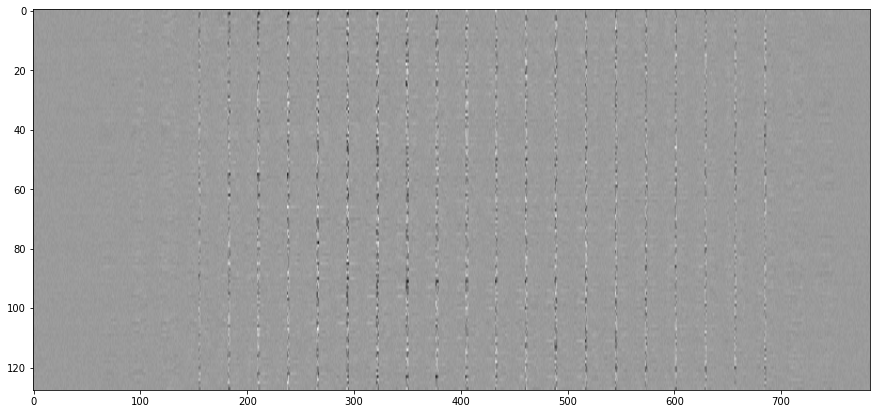

In [372]:
fig = plt.figure()
fig.set_size_inches(15,7)
plt.imshow(((model.layers[1].get_weights()[0].T*X_train[0])+(model.layers[1].get_weights()[1].flatten().reshape(-1,1))[0])\
          ,aspect='auto',cmap='gray')

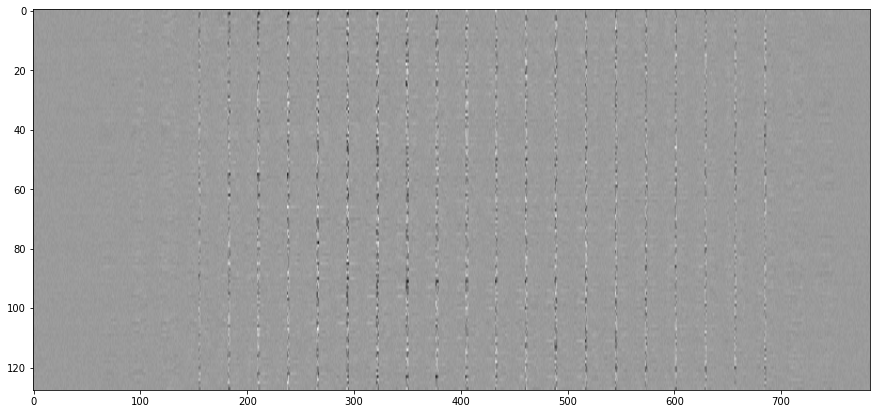

In [354]:
fig = plt.figure()
fig.set_size_inches(15,7)
#plt.imshow(X_train[1].flatten()*model.layers[1].get_weights()[0].T,aspect='auto')
plt.imshow((model.layers[1].get_weights()[0].T*X_train[0]),aspect='auto',cmap='gray')

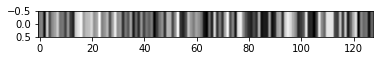

In [353]:
plt.imshow(model.layers[1].get_weights()[0][2].reshape(-1,1).T,aspect=10,cmap='gray')

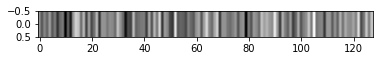

In [373]:
plt.imshow(model.layers[1].get_weights()[1].reshape(-1,1).T,aspect=10,cmap='gray')

In [331]:
model.layers[1].get_weights()[1]

array([-9.06104688e-03, -2.16577612e-02, -1.22376615e-02, -1.89660080e-02,
       -7.42207095e-03, -2.13062298e-02, -1.43697290e-02, -2.89566666e-02,
       -1.75437629e-02, -1.45910261e-02, -3.92336287e-02, -1.96587350e-02,
       -3.43090259e-02, -7.58730154e-03,  3.19240126e-03,  2.71792407e-04,
       -1.67120919e-02, -2.16498808e-03, -2.57228613e-02, -7.23406998e-03,
       -2.43230704e-02, -1.61678866e-02, -2.22493499e-03, -2.86776293e-02,
       -9.03046411e-03, -9.12489649e-03, -1.46506773e-02, -1.05860382e-02,
       -1.15187597e-02, -1.71062890e-02,  6.37311168e-05, -9.20000114e-03,
       -1.74247585e-02, -3.64166535e-02, -2.35288218e-02, -2.59024017e-02,
       -1.67022378e-03, -1.92295853e-02, -1.64102074e-02, -1.46977976e-02,
       -1.40690850e-02, -2.67077629e-02, -4.70843585e-03, -2.21118052e-02,
       -2.45442707e-03, -1.47342365e-02,  4.40179044e-03, -2.79859006e-02,
       -7.77285919e-03, -1.18705798e-02, -2.51580644e-02, -2.83700377e-02,
        7.54834665e-03, -

In [330]:
(X_train[1].flatten()*model.layers[1].get_weights()[0].T).shape

(128, 784)

In [333]:
(X_train[1].flatten()*model.layers[1].get_weights()[0].T)+model.layers[1].get_weights()[1].reshape(-1,1)

array([[ 0.00220568,  0.01134863, -0.01266176, ...,  0.01637369,
        -0.04013569,  0.01299014],
       [-0.01052102, -0.02163672, -0.02768626, ..., -0.00990183,
        -0.06439926, -0.04966944],
       [ 0.00712777, -0.02773596,  0.01561196, ..., -0.0163102 ,
        -0.01150177,  0.00627555],
       ...,
       [ 0.01289756,  0.01845259, -0.00036486, ...,  0.0079847 ,
        -0.02188855, -0.00786434],
       [-0.04240366, -0.00022171,  0.01455529, ...,  0.01280106,
         0.01479045, -0.04455945],
       [ 0.00487688,  0.02690463,  0.00403051, ...,  0.01775983,
         0.01973477,  0.00838488]])

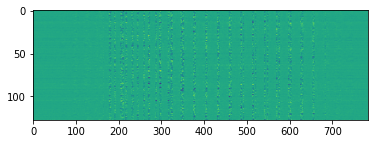

In [334]:
plt.imshow((X_train[1].flatten()*model.layers[1].get_weights()[0].T)+model.layers[1].get_weights()[1].reshape(-1,1),aspect=2)

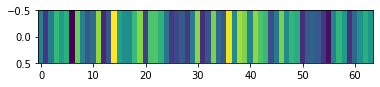

In [241]:
plt.imshow(model.layers[3].get_weights()[0][2].reshape(-1,1).T,aspect=10)

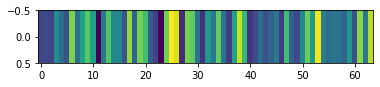

In [244]:
plt.imshow(model.layers[3].get_weights()[1].reshape(-1,1).T,aspect=10)

In [250]:
model.layers[3].get_weights()[0][2].shape

(64,)

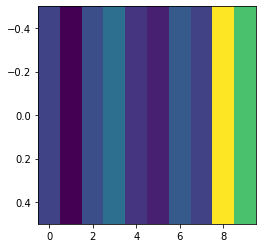

In [245]:
plt.imshow(model.layers[5].get_weights()[1].reshape(-1,1).T,aspect=10)

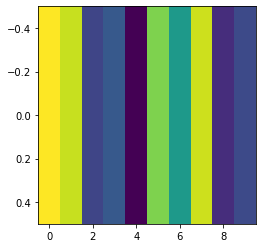

In [242]:
plt.imshow(model.layers[5].get_weights()[0][2].reshape(-1,1).T,aspect=10)

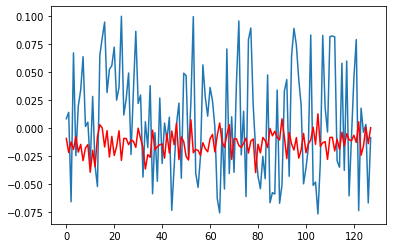

In [262]:
plt.plot(model.layers[1].get_weights()[0][2])
plt.plot(model.layers[1].get_weights()[1], color='r')
plt.show()

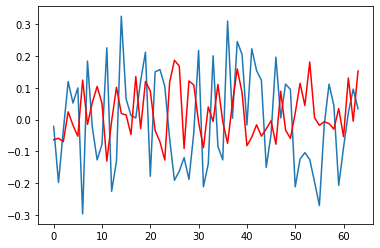

In [265]:
plt.plot(model.layers[3].get_weights()[0][2])
plt.plot(model.layers[3].get_weights()[1], color='r')
plt.show()

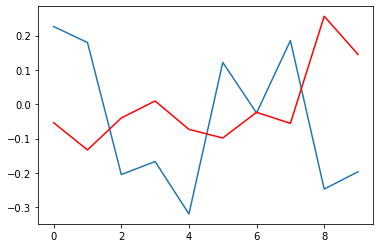

In [266]:
plt.plot(model.layers[5].get_weights()[0][2])
plt.plot(model.layers[5].get_weights()[1], color='r')
plt.show()

In [106]:
dir(model.layers[1])

['_TF_MODULE_IGNORED_PROPERTIES',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_activity_regularizer',
 '_add_trackable',
 '_add_variable_with_custom_getter',
 '_auto_track_sub_layers',
 '_autocast',
 '_autographed_call',
 '_build_input_shape',
 '_call_accepts_kwargs',
 '_call_arg_was_passed',
 '_call_fn_arg_defaults',
 '_call_fn_arg_positions',
 '_call_fn_args',
 '_call_full_argspec',
 '_callable_losses',
 '_cast_single_input',
 '_checkpoint_dependencies',
 '_clear_losses',
 '_compute_dtype',
 '_compute_dtype_object',
 '_dedup_weights',
 '_default_training_arg',
 '_deferred_dependencies',
 '_delete_tracking',
 '_dtype

In [118]:
model.get_layer(name="layer1").get_output_at()

TypeError: get_output_at() missing 1 required positional argument: 'node_index'

In [112]:
model.layers[0].output()[0]

TypeError: 'KerasTensor' object is not callable

In [79]:
model.layers[1].get_weights()[1]

array([-9.06104688e-03, -2.16577612e-02, -1.22376615e-02, -1.89660080e-02,
       -7.42207095e-03, -2.13062298e-02, -1.43697290e-02, -2.89566666e-02,
       -1.75437629e-02, -1.45910261e-02, -3.92336287e-02, -1.96587350e-02,
       -3.43090259e-02, -7.58730154e-03,  3.19240126e-03,  2.71792407e-04,
       -1.67120919e-02, -2.16498808e-03, -2.57228613e-02, -7.23406998e-03,
       -2.43230704e-02, -1.61678866e-02, -2.22493499e-03, -2.86776293e-02,
       -9.03046411e-03, -9.12489649e-03, -1.46506773e-02, -1.05860382e-02,
       -1.15187597e-02, -1.71062890e-02,  6.37311168e-05, -9.20000114e-03,
       -1.74247585e-02, -3.64166535e-02, -2.35288218e-02, -2.59024017e-02,
       -1.67022378e-03, -1.92295853e-02, -1.64102074e-02, -1.46977976e-02,
       -1.40690850e-02, -2.67077629e-02, -4.70843585e-03, -2.21118052e-02,
       -2.45442707e-03, -1.47342365e-02,  4.40179044e-03, -2.79859006e-02,
       -7.77285919e-03, -1.18705798e-02, -2.51580644e-02, -2.83700377e-02,
        7.54834665e-03, -

## Further exploration (Not evaluated)
Looking for something else  to do?
- Transform your code to do hyperparameter search. 
- You can vary the number of nodes in the layers, the drop out rate, the optimizer and the parameters in Adam, the batch size, etc.
